# COVID-19 : Social Distancing & Global Warming
## Analysis of the effect of social distancing and the level of air pollution

## By Immamul Morsilin, Mahesh Sullivan and Kam Okafor

#### Published 07/21/2020

##### Table of Contents
1. Introduction 
2. Data Collection
3. Data Processing
4. Exploratory Analysis & Data Visualization
5. Analysis, Hypothesis Testing & ML
6. Insight & Policy Decision

# 1.0 Introduction
100 years ago the world experienced a global pandemic. The Spanish Flu of 1918 ravaged the world with 500 million cases and took the life of estimated 50,000,000 people worldwide. Now 100 years later, we are dealing a similar scenario. At the time of writing, there are an estimated 14,329,577 cases worldwide with 601,894 deaths. Almost 9 million have recovered from the virus. The U.S. alone has almost 4 million cases and approaching 140,000+ deaths and on the rise. The entire world has felt the effect of this deadly virus as it spread to every corner of the Earth. We are living through a period of time that will be documented and analyzed for years to come. Did anyone see this coming?

Pandemic specialists have long speculated that a new deadly virus might be right around the corner. In fact, in 2015, Bill Gates gave a TED talk about the same exact scenario we are living through right now. He talks about how the next outbreak in a 21st century world will be a huge challenge but no one really expected something like this to happen. This is something we often have only seen in the movies or the history books. 

There is another ongoing global crisis that a lot of people are not taking seriously. That is the climate change due to increased human activities and emissions on the Planet Earth. According to NASA, "the planets average surface temperature has risen about 1.62 degrees Fahrenheit (0.9 degreses Celsius) since the late 19th century", as change driven largely by increased carbon dioxide and other human-made emissions into the atmosphere.

For our project, we are going to take a look at the effect of COVID-19 induced social distancing on air pollution. Our hypothesis is that social distancing can help mitigate the effects of global warming.

We used the following packages:
- numpy
- pandas
- scipy
- matplotlib
- scikitlearn
- seaborn
- mplfinance
- pandas-datareader

as well as Jupyter Lab.

# 2.0 Data Collection

We are going to look at any correlation between the social distancing period from January 2020 to June 2020 and air pollution levels. Spcifically, we will see if the air pollution level dropped in densely populated areas because of social distancing.

The way we are measuring social distancing is how much people are moving around, going out, shopping outside, etc.

For example, We will use a number of databases including:
1. Passengers data from all U.S. and Foreign careers from all airports - https://www.transtats.bts.gov/Data_Elements.aspx
2. Retail sales data for various services - https://www.census.gov/retail/index.html
3. Trips by distance in the U.S. - https://data.bts.gov/Research-and-Statistics/Trips-by-Distance/w96p-f2qv/data
4. The Stock Exchange Report for U.S. - https://finance.yahoo.com/
5. Global Air Quality Index Measurements - https://aqicn.org/api/

#### First we will create the necessary dataframes from the data:

In [6]:
import numpy as np
import scipy as sp
import pandas as pd

import sklearn
import plotnine
import requests
import datetime

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from scipy.stats import pearsonr

import seaborn as sns
import matplotlib.pyplot as plt 
from pandas_datareader import data as web_info, wb
#from mpl_finance import candlestick_ohlc <-- use this only if you use mpl-finance and not mplfinance package
from mplfinance.original_flavor import candlestick_ohlc
from matplotlib.dates import DateFormatter, WeekdayLocator, DayLocator, MONDAY

%pylab inline
%matplotlib inline
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
pylab.rcParams['figure.figsize'] = (28, 12)   # Change the size of plots

# We will first create a dataframe for the number of airlines passenger for U.S. and International flights since 2002
pass_df = pd.read_excel(r'Passenger.xlsx')
pass_df

# We will only look at the first few months of every year
# since social-distancing period was during the beginning of 2020
months = [1,2,3,4]
pass_df = pass_df.loc[pass_df['Month'].isin(months)]
pass_df

# Next we will create a dataframe for retail sales in the U.S. for 2019 and 2020 for comparison
# We will use this to show how various services in U.S. was losing businesses due to social distancing

retail_2019 = pd.read_excel(r'U.S._Retail_Data_2019.xlsx')
retail_2020 = pd.read_excel(r'U.S._Retail_Data_2020.xlsx')

# We will also make a dataframe to track the number of trips made in the cities we selected
# Note: We will only compare U.S. cities for this 
trips = pd.read_excel(r'Trips_Data.xlsx')

# Now we will gather the Air Quality Index data for various cities
desiredcities = ['Washington D.C.','Brooklyn','Los Angeles', 'Seattle','Mumbai', 'New Delhi', 'Chennai','Kolkata','Beijing','Shanghai','Chengdu','Nanjing','Moscow']
chunk = 2 * 10 ** 6

aqi2019_1 = pd.DataFrame()
for ck in pd.read_csv('waqi-covid-2019Q1.csv', chunksize=chunk):
    aqi2019_1 = ck.loc[ck['City'].isin(desiredcities)]

aqi2019_2 = pd.DataFrame()
for ck in pd.read_csv('waqi-covid-2019Q2.csv', chunksize=chunk):
    aqi2019_2 = ck.loc[ck['City'].isin(desiredcities)]
    
aqi2019_3 = pd.DataFrame()
for ck in pd.read_csv('waqi-covid-2019Q3.csv', chunksize=chunk):
    aqi2019_3 = ck.loc[ck['City'].isin(desiredcities)]
    
aqi2019_4 = pd.DataFrame()
for ck in pd.read_csv('waqi-covid-2019Q4.csv', chunksize=chunk):
    aqi2019_4 = ck.loc[ck['City'].isin(desiredcities)]
    
list2019csv = [aqi2019_1,aqi2019_2,aqi2019_3,aqi2019_4]
aqi2019 = pd.concat(list2019csv)
    
aqi2020 = pd.DataFrame()
for ck in pd.read_csv('waqi-covid-2020.csv', chunksize=chunk):
    aqi2020 = ck.loc[ck['City'].isin(desiredcities)]


Populating the interactive namespace from numpy and matplotlib


# 3.0 Data Processing
We'll clean up the data a little so we understand the full effect of social distancing.

### 3.1 : Airline Passenger Data Cleanup


For the passenger dataframe, we will rearrange the data so that each year has its own row and the months and total passengers as columns. This way the dataframe is much more condensed and looks nicer.

In [7]:
pass_df.index = np.arange(1, len(pass_df) + 1)
years = pass_df['Year'].unique()

# Creating the columns for the months 
# We will have two extra columns, one for domestic and one for international as marked by i and d
jan_d, jan_i = [],[]
feb_d, feb_i = [],[]
mar_d, mar_i = [],[]
apr_d, apr_i = [],[]


for idx, val in pass_df['Month'].iteritems():
    if val == 1:
        jan_d.append(pass_df['DOMESTIC'][idx])
        jan_i.append(pass_df['INTERNATIONAL'][idx])
    if val == 2:
        feb_d.append(pass_df['DOMESTIC'][idx])
        feb_i.append(pass_df['INTERNATIONAL'][idx])
    if val == 3:
        mar_d.append(pass_df['DOMESTIC'][idx])
        mar_i.append(pass_df['INTERNATIONAL'][idx])
    if val == 4:
        apr_d.append(pass_df['DOMESTIC'][idx])
        apr_i.append(pass_df['INTERNATIONAL'][idx])
        
# Creating the new dataframe 
columns = ["Year", "Jan_D", "Jan_I", "Feb_D", "Feb_I", "Mar_D", "Mar_I", "Apr_D","Apr_I"]
data = np.array([years, jan_d, jan_i, feb_d, feb_i, mar_d, mar_i, apr_d, apr_i])
pass_df = pd.DataFrame(data.T, columns = columns)

pass_df.index += 1

### 3.2 Retail Data Cleanup

First we will delete some columns so that it only includes the social-distancing period (Jan, Feb, Mar and Apr).
Then we will select the appropritate categories that had the most effect from social-distancing.


In [8]:
# deleting columns that we don't need
del retail_2020['May 2020 (p)']
retail_2019 = retail_2019.drop(retail_2019.columns[[5,6,7,8,9,10,11,12]], axis=1)

# Filtering out rows that we want to examine
filter_cat = ["Retail sales, total", "Furniture, home furn, electronics, and appliance stores","Grocery stores","Clothing and clothing access. stores","Nonstore retailers","Food services and drinking places", "Gasoline stations" ]
retail_2020 = retail_2020.loc[retail_2020["Category"].isin(filter_cat)]
retail_2019 = retail_2019.loc[retail_2019["Category"].isin(filter_cat)]

# reassigning indexes 
retail_2019.index = np.arange(1, len(retail_2019) + 1)
retail_2020.index = np.arange(1, len(retail_2020) + 1)

### 3.3 Trips traveled Data cleanup
There are a number of cleanups that we will need to do for this dataframe.
1. Get rid of columns that we do not need.
2. Compress the dataframe so it only includes the averages of each locations.

In [9]:
trips = trips.drop(trips.columns[[0,2,3,4]], axis=1)

### 3.4 Air Quality Index Data Clean Up
Now we will clean up the AQI data for both 2019 and 2020. Again, we will only focus on the social distancing period that occurs mostly in the first quarter of 2020.

For measuring air quality, we will focus on Temperature, Humidity, Ozone (o3), Carbon Monoxide (co), Sulfur Dioxide (so2), Nitrogen Dioxide (no2), Coarse Particles (pm10), and Fine Particles (pm25). We will also convert the date column so that it includes only date objects. Additionally, we will add columns which specify the day of the year (1 through 365) and the year. For the 2019 data, there is some data points from 2018 and 2020, which we will drop.

In [10]:
# drop extraneous specie
aqi2019 = aqi2019[aqi2019.Specie != "pressure"]
aqi2019 = aqi2019[aqi2019.Specie != "wind gust"]
aqi2019 = aqi2019[aqi2019.Specie != "wind-gust"]
aqi2019 = aqi2019[aqi2019.Specie != "dew"]
aqi2019 = aqi2019[aqi2019.Specie != "wind speed"]
aqi2019 = aqi2019[aqi2019.Specie != "wind-speed"]
aqi2019 = aqi2019[aqi2019.Specie != "pressure"]
aqi2019 = aqi2019[aqi2019.Specie != "pol"]
aqi2019 = aqi2019[aqi2019.Specie != "precipitation"]

aqi2020 = aqi2020[aqi2020.Specie != "pressure"]
aqi2020 = aqi2020[aqi2020.Specie != "wind gust"]
aqi2020 = aqi2020[aqi2020.Specie != "wind-gust"]
aqi2020 = aqi2020[aqi2020.Specie != "dew"]
aqi2020 = aqi2020[aqi2020.Specie != "wind speed"]
aqi2020 = aqi2020[aqi2020.Specie != "wind-speed"]
aqi2020 = aqi2020[aqi2020.Specie != "pressure"]
aqi2020 = aqi2020[aqi2020.Specie != "pol"]
aqi2020 = aqi2020[aqi2020.Specie != "precipitation"]

spec = aqi2019['Specie'].unique()


aqi2020.index = np.arange( 1, len(aqi2020) + 1)
aqi2019.index = np.arange(1, len(aqi2019) + 1)

print("Kept the following AQI Specie: ")
print(aqi2019['Specie'].unique())

date2019 = []
doy2019 = []
yearname2019 = []
for index,row in aqi2019.iterrows():
    date = datetime.datetime.strptime(row['Date'], "%Y-%m-%d")
    date2019.append(date)
    doy2019.append(date.timetuple().tm_yday)
    if date.year == 2018:
        yearname2019.append("Twenty-Eighteen")
    elif date.year == 2020:
        yearname2019.append("Twenty-Twenty")
    else:
        yearname2019.append("Twenty-Nineteen")
aqi2019['Date'] = date2019
aqi2019['Day Of Year'] = doy2019
aqi2019['Year'] = yearname2019

date2020 = []
doy2020 = []
yearname2020 = []
for index,row in aqi2020.iterrows():
    date = datetime.datetime.strptime(row['Date'], "%Y-%m-%d")
    date2020.append(date)
    doy2020.append(date.timetuple().tm_yday)
    yearname2020.append("Twenty-Twenty")
aqi2020['Date'] = date2020
aqi2020['Day Of Year'] = doy2020
aqi2020['Year'] = yearname2020

aqi2020.drop(aqi2020[aqi2020['Day Of Year'] >= 185].index,inplace=True)
aqi2019.drop(aqi2019[aqi2019['Year'] == 'Twenty-Eighteen'].index,inplace=True)
aqi2019.drop(aqi2019[aqi2019['Year'] == 'Twenty-Twenty'].index,inplace=True)
aqi2020.sort_values(by='Date',inplace=True)
aqi2019.sort_values(by='Date',inplace=True)

Kept the following AQI Specie: 
['temperature' 'humidity' 'pm25' 'so2' 'no2' 'co' 'o3' 'pm10' 'aqi']


# 4.0 Exploratory Analysis & Data Visualization

### 4.1 Airline Data analysis
First we will explore how airline traffic has been affected due to social-distancing

Here are the airline traffic for both domestic and international flights in the pre-covid years. This only includes the first few months in order to accurately compare with 2020.

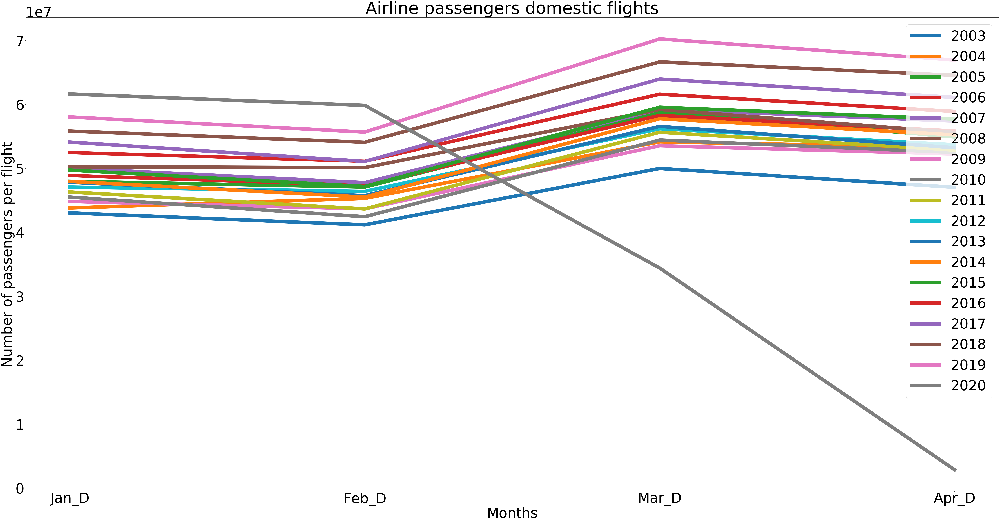

In [11]:
dom = pass_df[['Jan_D','Feb_D','Mar_D','Apr_D']]
inter = pass_df[['Jan_I','Feb_I','Mar_I','Apr_I']]

dom = dom.T
plt.figure(figsize=(100,50))
plt.rcParams.update({'font.size': 80})
plt.ylabel("Number of passengers per flight")
plt.xlabel("Months")
plt.title("Airline passengers domestic flights")
plt.plot(dom,linewidth=20.0, alpha=1)
plt.legend(pass_df['Year'], loc=1)
plt.show()

In [12]:
plt.rcParams.update({'font.size': 12})

As we can see from the above graph, 2020 is an atypical year so far. The number of passengers on flights dropped to almost negligible amounts over the course of February to April 2020. Thus, we can see here a rough boundary for the start of the lockdown period in the USA as between February and March 2020.

### 4.2 Stock Data analysis

In [13]:
def pandas_candlestick_ohlc(dat, stick = "day", title="" ,otherseries=None):
    """
    :param dat: pandas DataFrame object with datetime64 index, and float columns "Open", "High", "Low", and "Close", likely created via DataReader from "yahoo"
    :param stick: A string or number indicating the period of time covered by a single candlestick. Valid string inputs include "day", "week", "month", and "year", ("day" default), and any numeric input indicates the number of trading days included in a period
    :param otherseries: An iterable that will be made into a list, containing the columns of dat that hold other series to be plotted as lines
 
    This will show a Japanese candlestick plot for stock data stored in dat, also plotting other series if passed.
    """
    mondays = WeekdayLocator(MONDAY)        # major ticks on the mondays
    alldays = DayLocator()              # minor ticks on the days
    dayFormatter = DateFormatter('%d')      # e.g., 12
    
    # Create a new DataFrame which includes OHLC data for each period specified by stick input
    transdat = dat.loc[:,["Open", "High", "Low", "Close"]]
    if (type(stick) == str):
        if stick == "day":
            plotdat = transdat
            stick = 1 # Used for plotting
        elif stick in ["week", "month", "year"]:
            if stick == "week":
                transdat["week"] = pd.to_datetime(transdat.index).map(lambda x: x.isocalendar()[1]) # Identify weeks
            elif stick == "month":
                transdat["month"] = pd.to_datetime(transdat.index).map(lambda x: x.month) # Identify months
            transdat["year"] = pd.to_datetime(transdat.index).map(lambda x: x.isocalendar()[0]) # Identify years
            grouped = transdat.groupby(list(set(["year",stick]))) # Group by year and other appropriate variable
            plotdat = pd.DataFrame({"Open": [], "High": [], "Low": [], "Close": []}) # Create empty data frame containing what will be plotted
            
            for name, group in grouped:
                plotdat = plotdat.append(pd.DataFrame({"Open": group.iloc[0,0],
                                            "High": max(group.High),
                                            "Low": min(group.Low),
                                            "Close": group.iloc[-1,3]},
                                           index = [group.index[0]]))
            if stick == "week": stick = 5
            elif stick == "month": stick = 30
            elif stick == "year": stick = 365    
    elif (type(stick) == int and stick >= 1):
        transdat["stick"] = [np.floor(i / stick) for i in range(len(transdat.index))]
        grouped = transdat.groupby("stick")
        plotdat = pd.DataFrame({"Open": [], "High": [], "Low": [], "Close": []}) # Create empty data frame containing what will be plotted
        
        for name, group in grouped:
            plotdat = plotdat.append(pd.DataFrame(
                                        {"Open": group.iloc[0,0],
                                        "High": max(group.High),
                                        "Low": min(group.Low),
                                        "Close": group.iloc[-1,3]}, index = [group.index[0]]))
    else:
        raise ValueError('Valid inputs to argument "stick" include the strings "day", "week", "month", "year", or a positive integer')

    # Set plot parameters
    fig, ax = plt.subplots()
    fig.subplots_adjust(bottom=0.2)
    if plotdat.index[-1] - plotdat.index[0] < pd.Timedelta('730 days'):
        weekFormatter = DateFormatter('%b %d')  # e.g., Jan 12
        ax.xaxis.set_major_locator(mondays)
        ax.xaxis.set_minor_locator(alldays)
    else:
        weekFormatter = DateFormatter('%b %d, %Y')
    ax.xaxis.set_major_formatter(weekFormatter)
    ax.grid(True)
    
    # Create the candelstick chart
    candlestick_ohlc(ax, list(zip(list(date2num(plotdat.index.tolist())), plotdat["Open"].tolist(), plotdat["High"].tolist(),
                      plotdat["Low"].tolist(), plotdat["Close"].tolist())),
                      colorup = "black", colordown = "red", width = stick * .4)
    
    # Plot other series (such as moving averages) as lines
    if otherseries != None:
        if type(otherseries) != list:
            otherseries = [otherseries]
        dat.loc[:,otherseries].plot(ax = ax, lw = 1.3, grid = True)
    ax.xaxis_date()
    ax.autoscale_view()
    
    plt.setp(plt.gca().get_xticklabels(), rotation=45, horizontalalignment='right')
    plt.xlabel("Days", fontsize=18)
    plt.ylabel("Stock Price",fontsize=20)
    plt.title("%s Stock Portfolio" % title, size=10, weight='medium')
    plt.show()

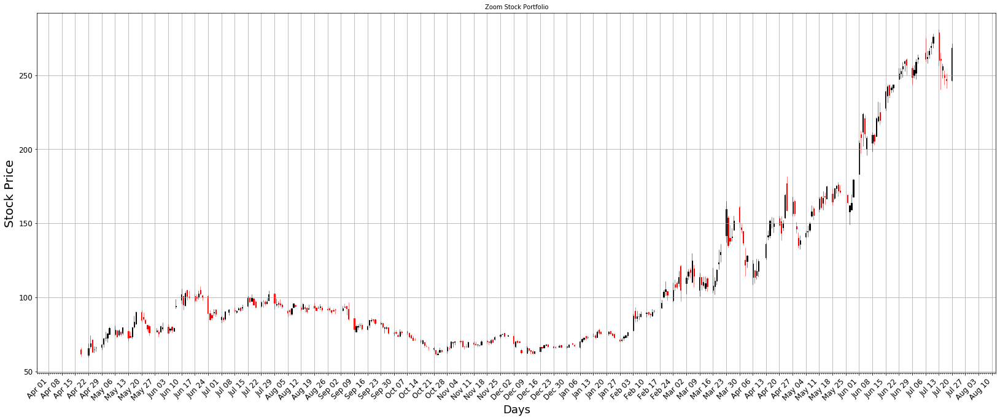

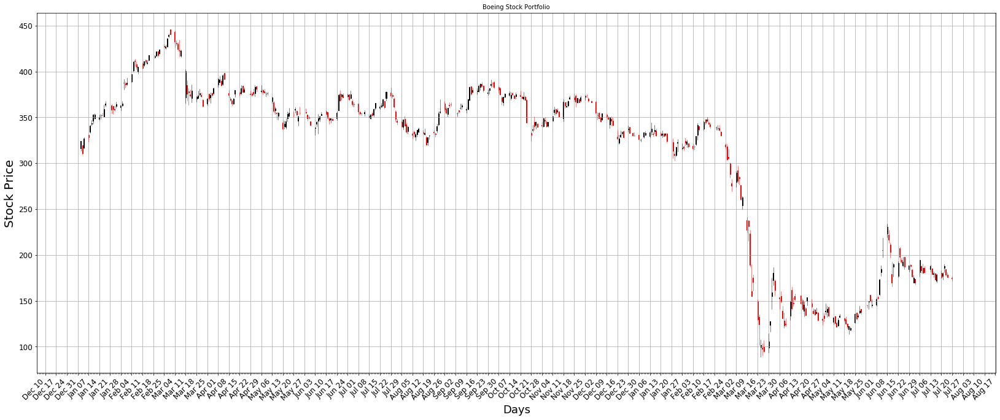

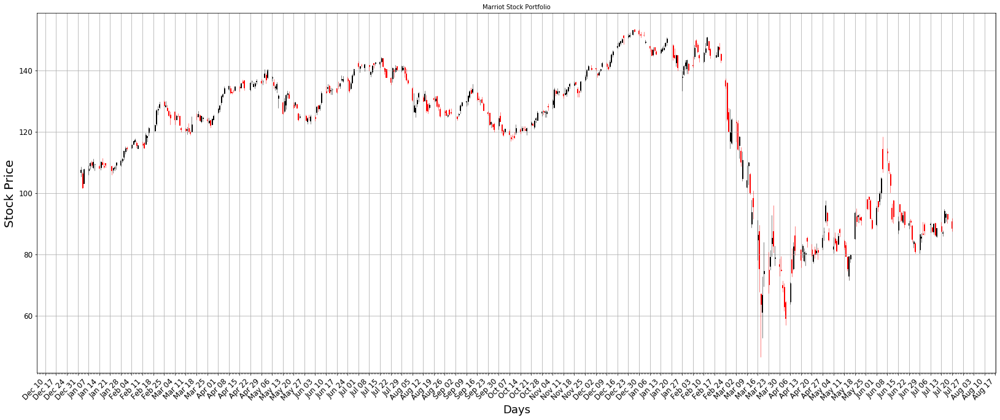

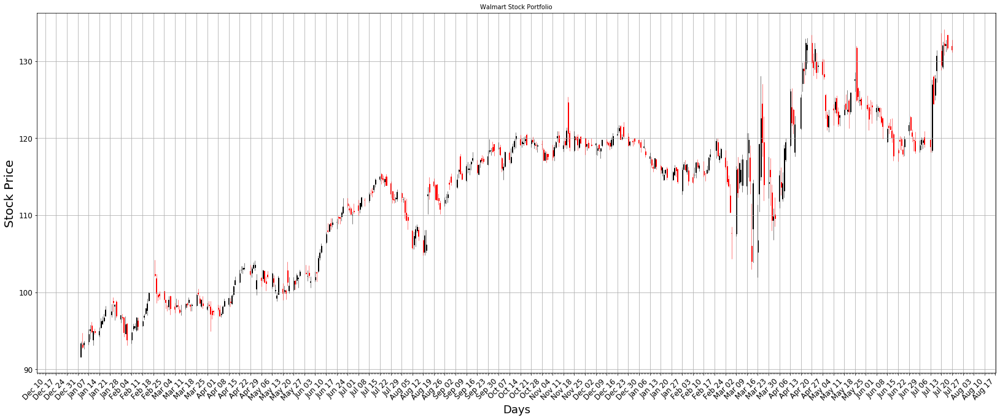

In [14]:
# pylab.rcParams['figure.figsize'] = (28, 12)   # Change the size of plots
# getting stock price data over the past year, starting at January 1, 2019
start_date = datetime.datetime(2019,1,1)
end_date = datetime.date.today() # up till current

# working with Zoom, Boeing, Marriot, walmart stock info
# First argument is the company stock information we want, second is the source ("yahoo" for Yahoo! Finance) 
zoom_stock_info = web_info.DataReader("ZM", "yahoo", start_date, end_date)
boeing_stock_info = web_info.DataReader("BA", "yahoo", start_date, end_date)
marriott_stock_info = web_info.DataReader("MAR", "yahoo", start_date, end_date)
walmart_stock_info = web_info.DataReader("WMT", "yahoo", start_date, end_date)
portfolios = [
    {
        "company_name" : "Zoom",
        "portfolio": zoom_stock_info,
    },
    {
        "company_name" : "Boeing",
        "portfolio": boeing_stock_info,
    },
    {
        "company_name" : "Marriot",
        "portfolio": marriott_stock_info,
    },
    {
        "company_name" : "Walmart",
        "portfolio": walmart_stock_info,
    }
]
for stock in portfolios:
    pandas_candlestick_ohlc(stock["portfolio"], title=stock["company_name"])

From the above stock charts, we can see that transit-associated companies like Boeing (Aerospace and Airlines) and Marriott (Hotels) had significant crashes of their stock prices in late February and early March. Neither of these companies have recovered to pre-crash values as of yet.

Unlike those companies, companies like Zoom and Walmart have shown overall increases in stock price. This is likely due to an increase in "work from home" (Zoom) and the necessity of shopping for supplies (Walmart).

### 4.3 Retail Data Analysis
The dataframes below lists and helps us compare the total buys (in millions) of differnt retail categories for the first four months of 2019 and 2020. These frames will help us understand just how much people stopped going out to purchase items. These frames will help us note the differences.

<Figure size 7200x3600 with 0 Axes>

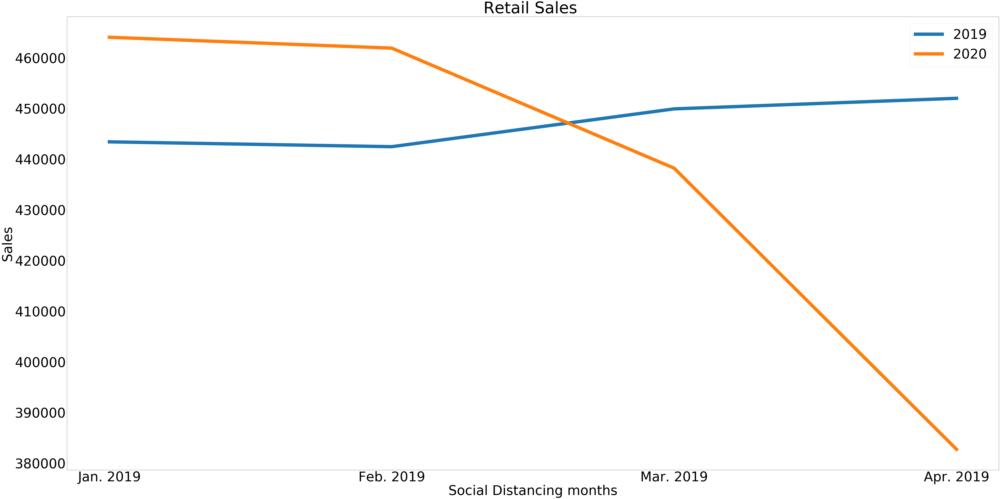

In [15]:
# Filtering out rows that we want to examine
filter_cat = ["Retail sales, total", "Furniture, home furn, electronics, and appliance stores","Grocery stores","Clothing and clothing access. stores","Nonstore retailers","Food services and drinking places", "Gasoline stations" ]
retail_2020 = retail_2020.loc[retail_2020["Category"].isin(filter_cat)]
retail_2019 = retail_2019.loc[retail_2019["Category"].isin(filter_cat)]

# reassigning indexes 
retail_2019.index = np.arange(1, len(retail_2019) + 1)
retail_2020.index = np.arange(1, len(retail_2020) + 1)

plt.rcParams.update({'font.size':70})
plt.figure(figsize=(100,50))

retail_2019

retail_total_19, retail_total_20 = [], []
furniture_19, furniture_20 = [], []
grocery_19, grocery_20 = [], []
gas_19, gas_20 = [], []
cloth_19, cloth_20 = [], []
nonstore_19, nonstore_20 = [], []
food_19, food_20 = [],[]

for idx, val in retail_2019['Category'].iteritems():
    if idx == 1:
        retail_total_19.append(retail_2019['Jan. 2019'][idx])
        retail_total_19.append(retail_2019['Feb. 2019'][idx])
        retail_total_19.append(retail_2019['Mar. 2019'][idx])
        retail_total_19.append(retail_2019['Apr. 2019'][idx])
        retail_total_20.append(retail_2020['Jan. 2020'][idx])
        retail_total_20.append(retail_2020['Feb. 2020'][idx])
        retail_total_20.append(retail_2020['Mar. 2020'][idx])
        retail_total_20.append(retail_2020['Apr. 2020'][idx])
    if idx == 2:
        furniture_19.append(retail_2019['Jan. 2019'][idx])
        furniture_19.append(retail_2019['Feb. 2019'][idx])
        furniture_19.append(retail_2019['Mar. 2019'][idx])
        furniture_19.append(retail_2019['Apr. 2019'][idx])
        furniture_20.append(retail_2020['Jan. 2020'][idx])
        furniture_20.append(retail_2020['Feb. 2020'][idx])
        furniture_20.append(retail_2020['Mar. 2020'][idx])
        furniture_20.append(retail_2020['Apr. 2020'][idx])   
    if idx == 3:
        grocery_19.append(retail_2019['Jan. 2019'][idx])
        grocery_19.append(retail_2019['Feb. 2019'][idx])
        grocery_19.append(retail_2019['Mar. 2019'][idx])
        grocery_19.append(retail_2019['Apr. 2019'][idx])
        grocery_20.append(retail_2020['Jan. 2020'][idx])
        grocery_20.append(retail_2020['Feb. 2020'][idx])
        grocery_20.append(retail_2020['Mar. 2020'][idx])
        grocery_20.append(retail_2020['Apr. 2020'][idx])
    if idx == 4:
        gas_19.append(retail_2019['Jan. 2019'][idx])
        gas_19.append(retail_2019['Feb. 2019'][idx])
        gas_19.append(retail_2019['Mar. 2019'][idx])
        gas_19.append(retail_2019['Apr. 2019'][idx])
        gas_20.append(retail_2020['Jan. 2020'][idx])
        gas_20.append(retail_2020['Feb. 2020'][idx])
        gas_20.append(retail_2020['Mar. 2020'][idx])
        gas_20.append(retail_2020['Apr. 2020'][idx])
    if idx == 5:
        cloth_19.append(retail_2019['Jan. 2019'][idx])
        cloth_19.append(retail_2019['Feb. 2019'][idx])
        cloth_19.append(retail_2019['Mar. 2019'][idx])
        cloth_19.append(retail_2019['Apr. 2019'][idx])
        cloth_20.append(retail_2020['Jan. 2020'][idx])
        cloth_20.append(retail_2020['Feb. 2020'][idx])
        cloth_20.append(retail_2020['Mar. 2020'][idx])
        cloth_20.append(retail_2020['Apr. 2020'][idx])
    if idx == 6:
        nonstore_19.append(retail_2019['Jan. 2019'][idx])
        nonstore_19.append(retail_2019['Feb. 2019'][idx])
        nonstore_19.append(retail_2019['Mar. 2019'][idx])
        nonstore_19.append(retail_2019['Apr. 2019'][idx])
        nonstore_20.append(retail_2020['Jan. 2020'][idx])
        nonstore_20.append(retail_2020['Feb. 2020'][idx])
        nonstore_20.append(retail_2020['Mar. 2020'][idx])
        nonstore_20.append(retail_2020['Apr. 2020'][idx])
    if idx == 7:
        food_19.append(retail_2019['Jan. 2019'][idx])
        food_19.append(retail_2019['Feb. 2019'][idx])
        food_19.append(retail_2019['Mar. 2019'][idx])
        food_19.append(retail_2019['Apr. 2019'][idx])
        food_20.append(retail_2020['Jan. 2020'][idx])
        food_20.append(retail_2020['Feb. 2020'][idx])
        food_20.append(retail_2020['Mar. 2020'][idx])
        food_20.append(retail_2020['Apr. 2020'][idx])
    

months_19 = ["Jan. 2019", "Feb. 2019", "Mar. 2019", "Apr. 2019"]
months_20 = ["Jan. 2020", "Feb. 2020", "Mar. 2020", "Apr. 2020"]

plt.rcParams.update({'font.size': 80})
plt.figure(figsize=(100,50))
plt.ylabel("Sales")
plt.xlabel("Social Distancing months")
plt.title("Retail Sales ")

plt.plot(months_19,retail_total_19, linewidth=20.0, alpha=1, label="Retail Sales, Total 2019")
plt.plot(months_19,retail_total_20, linewidth=20.0, alpha=1, label="Retail Sales, Total 2020")
plt.legend(['2019', '2020'], loc=1)

plt.show()



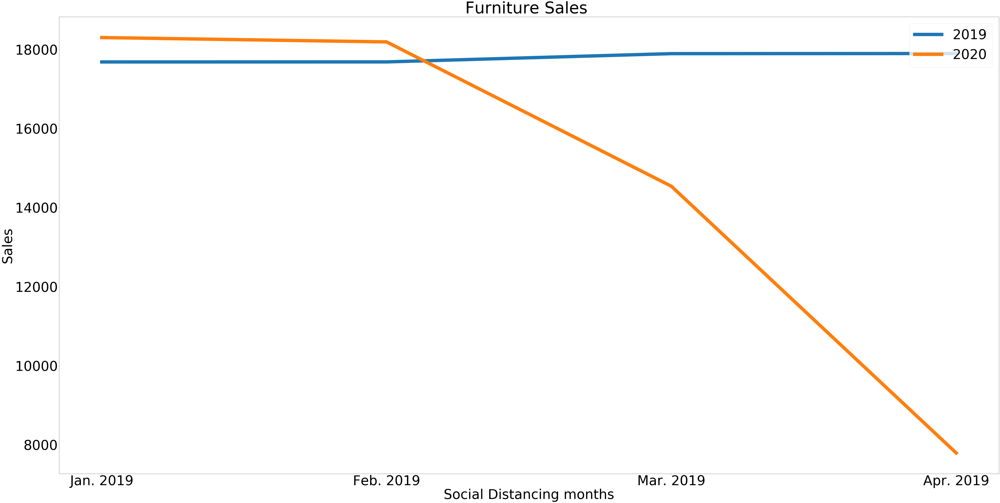

In [16]:
plt.rcParams.update({'font.size': 80})
plt.figure(figsize=(100,50))
plt.ylabel("Sales")
plt.xlabel("Social Distancing months")
plt.title("Furniture Sales ")

plt.plot(months_19,furniture_19, linewidth=20.0, alpha=1, label="Furniture Sales 2019")
plt.plot(months_19,furniture_20, linewidth=20.0, alpha=1, label="Furniture Sales 2020")
plt.legend(['2019', '2020'], loc=1)
plt.show()

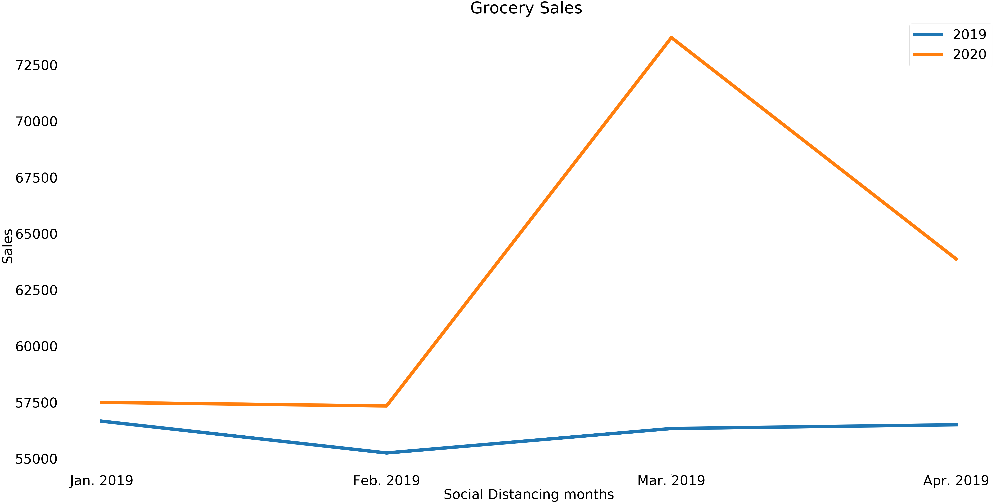

In [17]:
plt.rcParams.update({'font.size': 80})
plt.figure(figsize=(100,50))
plt.ylabel("Sales")
plt.xlabel("Social Distancing months")
plt.title("Grocery Sales ")

plt.plot(months_19,grocery_19, linewidth=20.0, alpha=1, label="Grocery Sales 2019")
plt.plot(months_19,grocery_20, linewidth=20.0, alpha=1, label="Grocery Sales 2020")
plt.legend(['2019', '2020'], loc=1)
plt.show()

As expected, grocery sales spiked in early 2020 as more and more people stockpiled supplies for the incoming pandemic induced lockdowns.

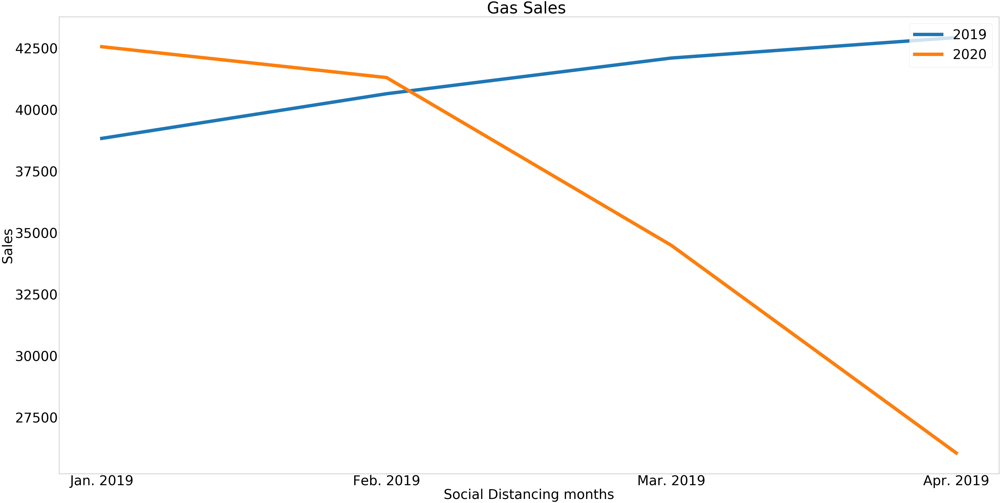

In [18]:
plt.rcParams.update({'font.size': 80})
plt.figure(figsize=(100,50))
plt.ylabel("Sales")
plt.xlabel("Social Distancing months")
plt.title("Gas Sales ")

plt.plot(months_19,gas_19, linewidth=20.0, alpha=1, label="Furniture Sales 2019")
plt.plot(months_19,gas_20, linewidth=20.0, alpha=1, label="Furniture Sales 2020")
plt.legend(['2019', '2020'], loc=1)
plt.show()

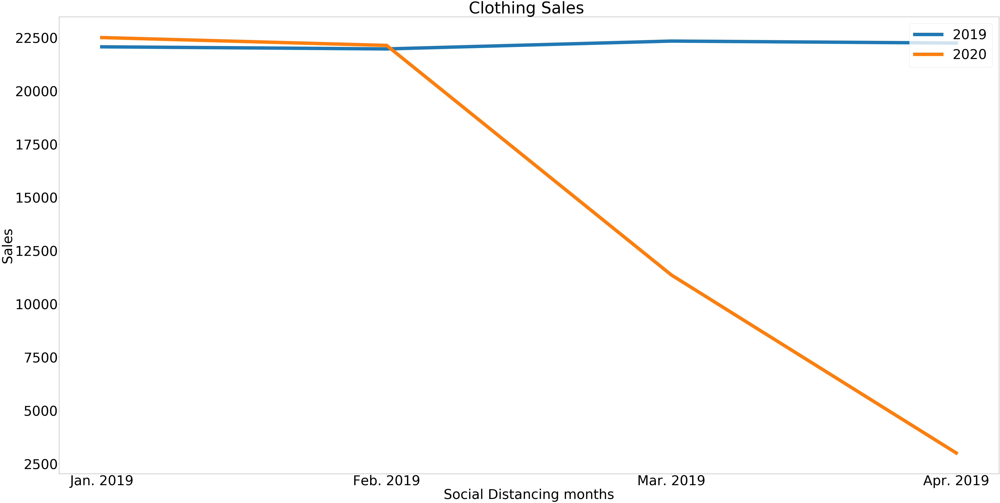

In [19]:
plt.rcParams.update({'font.size': 80})
plt.figure(figsize=(100,50))
plt.ylabel("Sales")
plt.xlabel("Social Distancing months")
plt.title("Clothing Sales ")

plt.plot(months_19,cloth_19, linewidth=20.0, alpha=1, label="Furniture Sales 2019")
plt.plot(months_19,cloth_20, linewidth=20.0, alpha=1, label="Furniture Sales 2020")
plt.legend(['2019', '2020'], loc=1)
plt.show()

Clothing sales significantly reduced as shopping malls across the U.S. shutdown completely.

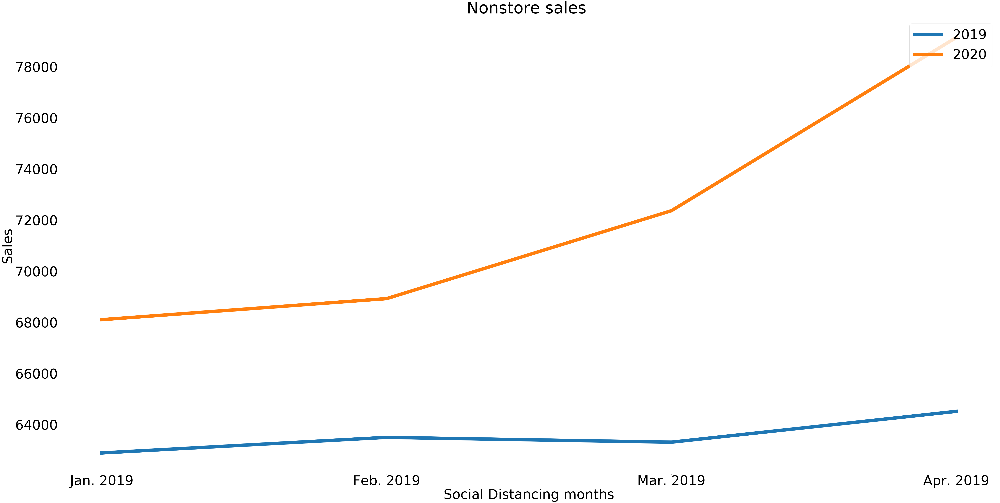

In [20]:
plt.rcParams.update({'font.size': 80})
plt.figure(figsize=(100,50))
plt.ylabel("Sales")
plt.xlabel("Social Distancing months")
plt.title("Nonstore sales ")

plt.plot(months_19,nonstore_19, linewidth=20.0, alpha=1, label="Furniture Sales 2019")
plt.plot(months_19,nonstore_20, linewidth=20.0, alpha=1, label="Furniture Sales 2020")
plt.legend(['2019', '2020'], loc=1)
plt.show()

As more and more people stayed inside, unable to shop outside, people turned to online shopping as shown by the steady increase in online sales in 2020 compared to 2019.

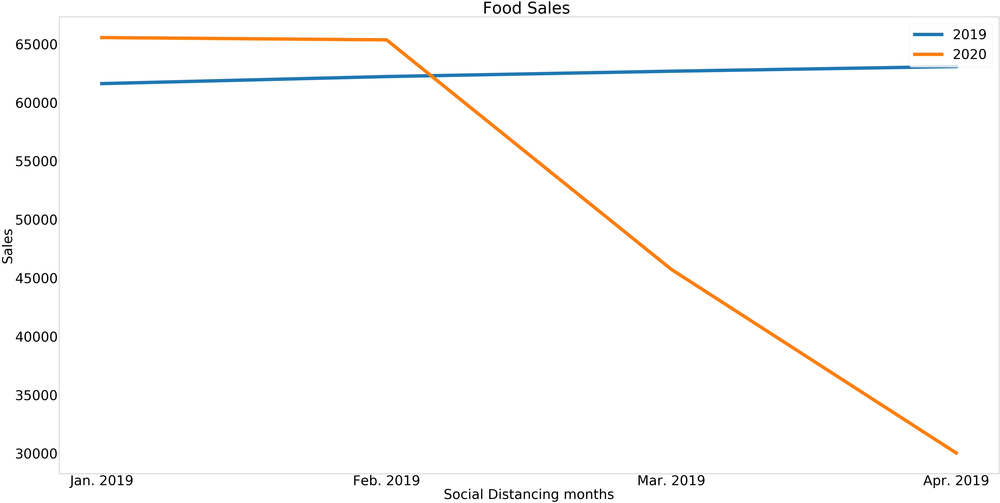

In [21]:
plt.rcParams.update({'font.size': 80})
plt.figure(figsize=(100,50))
plt.ylabel("Sales")
plt.xlabel("Social Distancing months")
plt.title("Food Sales ")

plt.plot(months_19,food_19, linewidth=20.0, alpha=1, label="Furniture Sales 2019")
plt.plot(months_19,food_20, linewidth=20.0, alpha=1, label="Furniture Sales 2020")
plt.legend(['2019', '2020'], loc=1)
plt.show()

### 4.4 Number of trips in U.S. Analysis
We will analyze the average number of trips that occured in the selected states. 
We will do 2019 first.

In [22]:
dates = trips['Date'].unique()

la_trips = trips.loc[trips['County Name'] == 'Los Angeles County']
dc_trips = trips.loc[trips['County Name'] == "District of Columbia"]
ny_trips = trips.loc[trips['County Name'] == "New York County"]

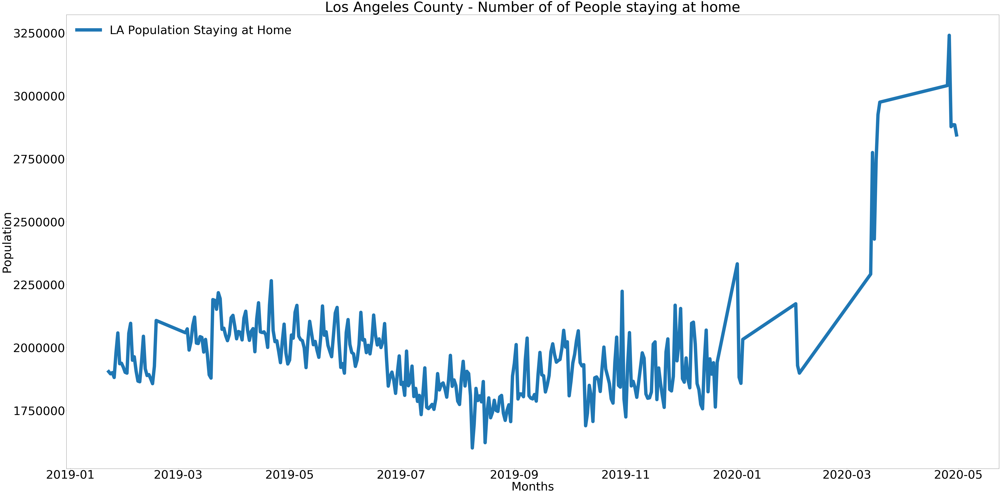

In [23]:
plt.rcParams.update({'font.size':70})
plt.figure(figsize=(100,50))
plt.ylabel("Population")
plt.xlabel("Months")
plt.title("Los Angeles County - Number of of People staying at home")
plt.plot(la_trips['Date'], la_trips['Population Staying at Home'], linewidth=20.0, alpha=1, label="LA Population Staying at Home")
plt.legend(loc="upper left", frameon=False)

As you can see, the number of people staying at home significantly increased since lockdown procedure - very different from how the begining of 2019 was. Let us also examing how the number of trips made were affected and how the distance of these trips changed as lockdown continued

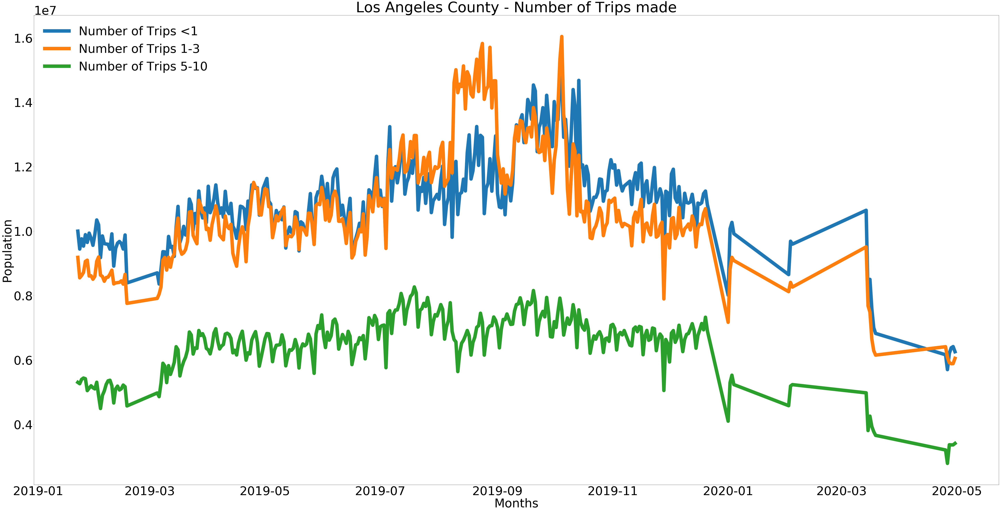

In [24]:
plt.rcParams.update({'font.size':70})
plt.figure(figsize=(100,50))
plt.ylabel("Population")
plt.xlabel("Months")
plt.title("Los Angeles County - Number of Trips made")
#plt.plot(la_trips['Date'], la_trips['Number of Trips'], linewidth=20.0, alpha=1, label="Number of Trips")
plt.plot(la_trips['Date'], la_trips['Number of Trips <1'], linewidth=20.0, alpha=1, label="Number of Trips <1")
plt.plot(la_trips['Date'], la_trips['Number of Trips 1-3'], linewidth=20.0, alpha=1, label="Number of Trips 1-3")
plt.plot(la_trips['Date'], la_trips['Number of Trips 5-10'], linewidth=20.0, alpha=1, label="Number of Trips 5-10")

plt.legend(loc="upper left", frameon=False)

As more and more people continued to stay inside, the number of people on the road significantly decreased.

Here are the complete list for DC and New York:

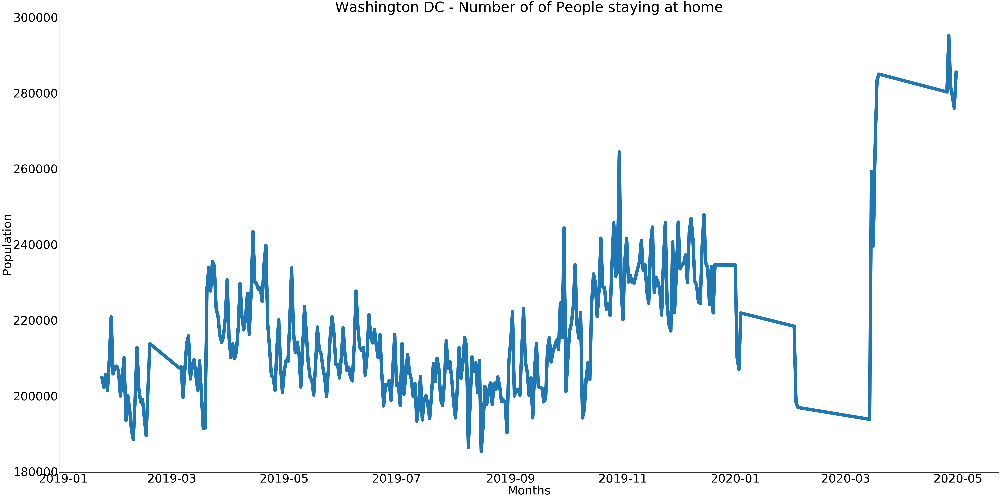

In [25]:
plt.rcParams.update({'font.size':70})
plt.figure(figsize=(100,50))
plt.ylabel("Population")
plt.xlabel("Months")
plt.title("Washington DC - Number of of People staying at home")
plt.plot(dc_trips['Date'], dc_trips['Population Staying at Home'], linewidth=20.0, alpha=1,)

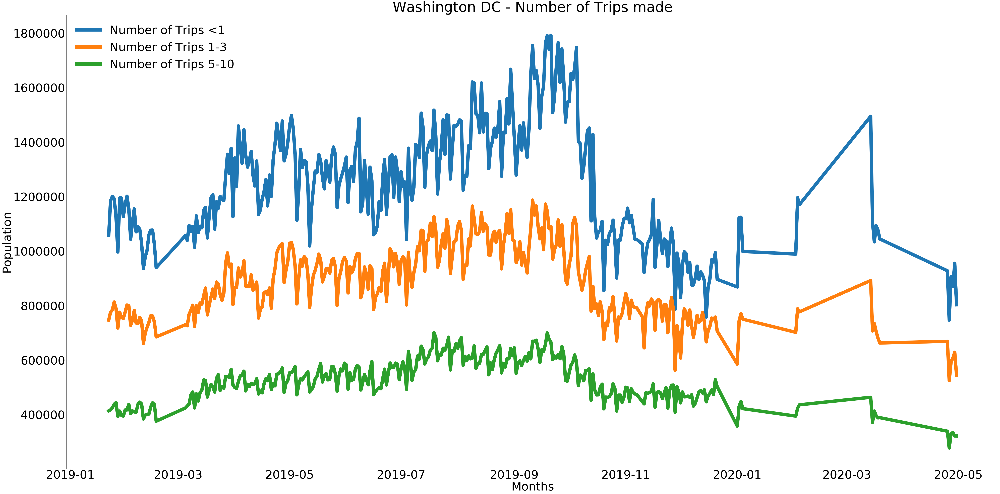

In [26]:
plt.rcParams.update({'font.size':70})
plt.figure(figsize=(100,50))
plt.ylabel("Population")
plt.xlabel("Months")
plt.title("Washington DC - Number of Trips made")
#plt.plot(la_trips['Date'], la_trips['Number of Trips'], linewidth=20.0, alpha=1, label="Number of Trips")
plt.plot(dc_trips['Date'], dc_trips['Number of Trips <1'], linewidth=20.0, alpha=1, label="Number of Trips <1")
plt.plot(dc_trips['Date'], dc_trips['Number of Trips 1-3'], linewidth=20.0, alpha=1, label="Number of Trips 1-3")
plt.plot(dc_trips['Date'], dc_trips['Number of Trips 5-10'], linewidth=20.0, alpha=1, label="Number of Trips 5-10")

plt.legend(loc="upper left", frameon=False)

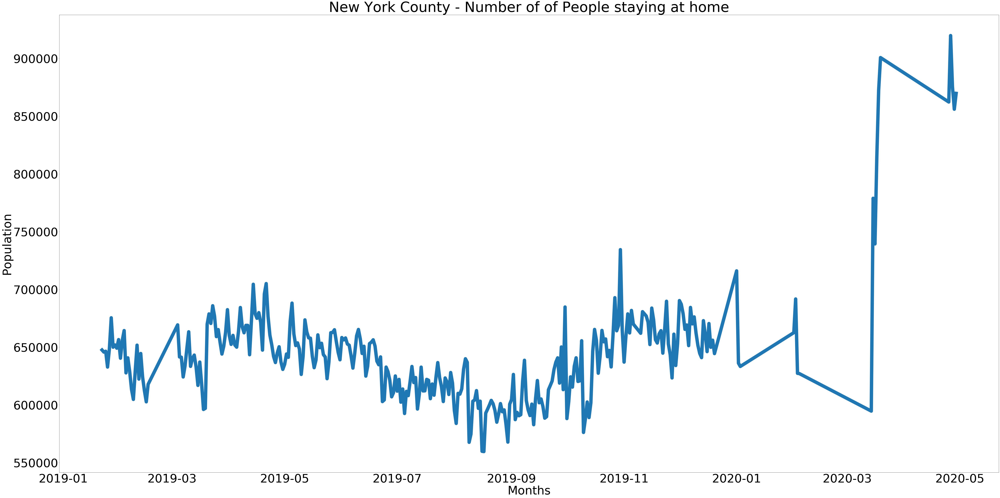

In [27]:
plt.rcParams.update({'font.size':70})
plt.figure(figsize=(100,50))
plt.ylabel("Population")
plt.xlabel("Months")
plt.title("New York County - Number of of People staying at home")
plt.plot(ny_trips['Date'], ny_trips['Population Staying at Home'], linewidth=20.0, alpha=1,)

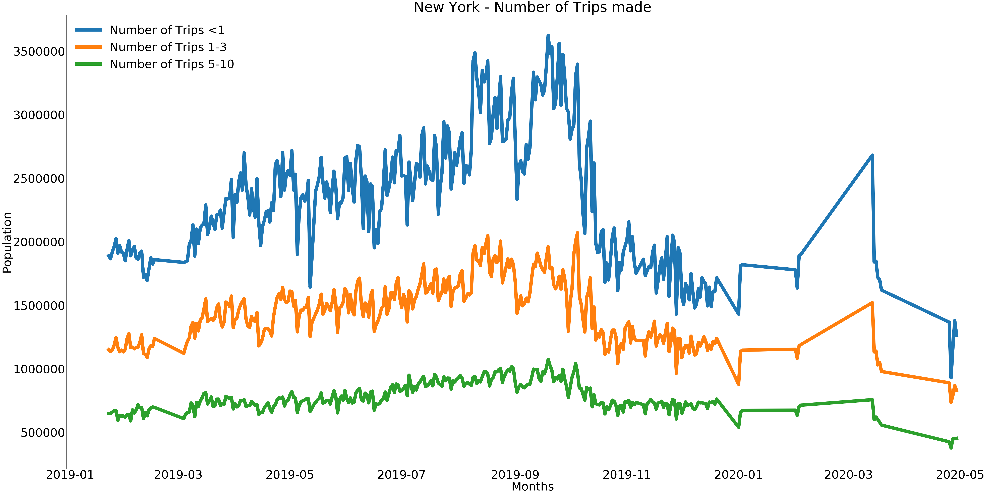

In [28]:
plt.rcParams.update({'font.size':70})
plt.figure(figsize=(100,50))
plt.ylabel("Population")
plt.xlabel("Months")
plt.title("New York - Number of Trips made")
#plt.plot(la_trips['Date'], la_trips['Number of Trips'], linewidth=20.0, alpha=1, label="Number of Trips")
plt.plot(ny_trips['Date'], ny_trips['Number of Trips <1'], linewidth=20.0, alpha=1, label="Number of Trips <1")
plt.plot(ny_trips['Date'], ny_trips['Number of Trips 1-3'], linewidth=20.0, alpha=1, label="Number of Trips 1-3")
plt.plot(ny_trips['Date'], ny_trips['Number of Trips 5-10'], linewidth=20.0, alpha=1, label="Number of Trips 5-10")

plt.legend(loc="upper left", frameon=False)

It is interesting to note that in the beginning of lockdowns, in all three cities, there was a huge spike in the number of trips less than 1 mile. This is likely due to people going to the grocery store to stockpile on supplies.

### 4.5 AQI Data Analysis

First we will look at some of the AQI measures available for different cities.

In [29]:
t2019 = aqi2019.loc[aqi2019['Specie'] == 'temperature']
t2020 = aqi2020.loc[aqi2020['Specie'] == 'temperature']
temperature = pd.concat([t2019, t2020])

h2019 = aqi2019.loc[aqi2019['Specie'] == 'humidity']
h2020 = aqi2020.loc[aqi2020['Specie'] == 'humidity']
humidity = pd.concat([h2019, h2020])

o2019 = aqi2019.loc[aqi2019['Specie'] == 'o3']
o2020 = aqi2020.loc[aqi2020['Specie'] == 'o3']
o3 = pd.concat([o2019, o2020])

co2019 = aqi2019.loc[aqi2019['Specie'] == 'co']
co2020 = aqi2020.loc[aqi2020['Specie'] == 'co']
co = pd.concat([co2019, co2020])

so2019 = aqi2019.loc[aqi2019['Specie'] == 'so2']
so2020 = aqi2020.loc[aqi2020['Specie'] == 'so2']
so2 = pd.concat([so2019, so2020])

pm2019 = aqi2019.loc[aqi2019['Specie'] == 'pm10']
pm2020 = aqi2020.loc[aqi2020['Specie'] == 'pm10']
pm10 = pd.concat([pm2019, pm2020])

pm25_2019 = aqi2019.loc[aqi2019['Specie'] == 'pm25']
pm25_2020 = aqi2020.loc[aqi2020['Specie'] == 'pm25']
pm25 = pd.concat([pm25_2019, pm25_2020])

no2019 = aqi2019.loc[aqi2019['Specie'] == 'no2']
no2020 = aqi2020.loc[aqi2020['Specie'] == 'no2']
no2 = pd.concat([no2019, no2020])

In [30]:
plt.rcParams.update({'font.size': 12})

We will now plot each of the above selected AQI species per-city with separate lines for each year. This way we can see any interesting correlations visually.

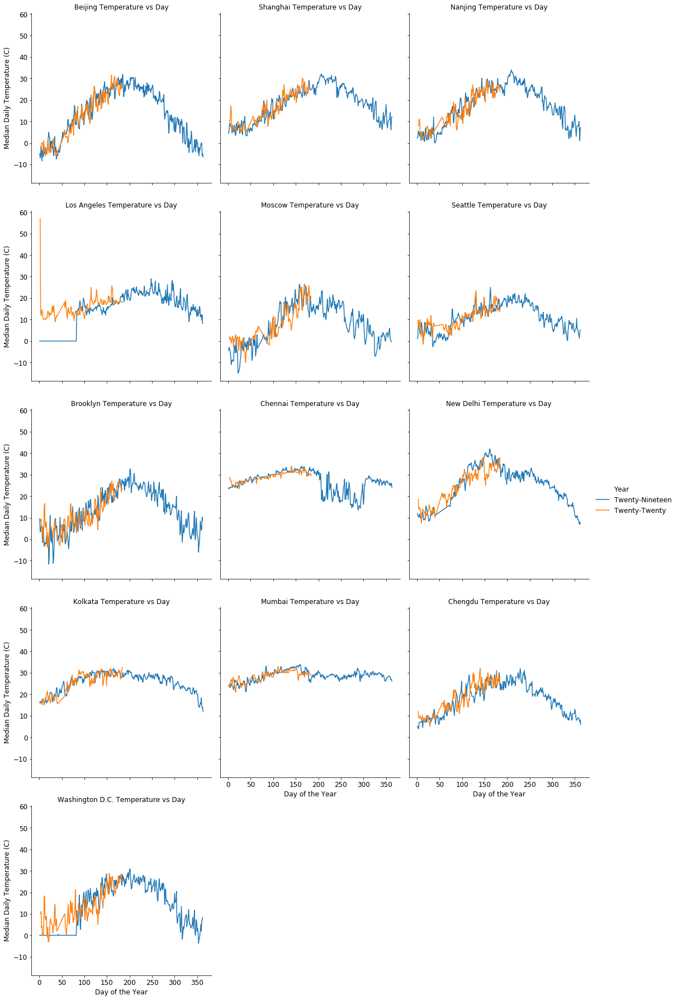

In [31]:
sns.relplot(x='Day Of Year', y='median', hue='Year', col='City', col_wrap=3, kind='line', data=temperature).set_titles("{col_name} Temperature vs Day").set_axis_labels("Day of the Year","Median Daily Temperature (C)")

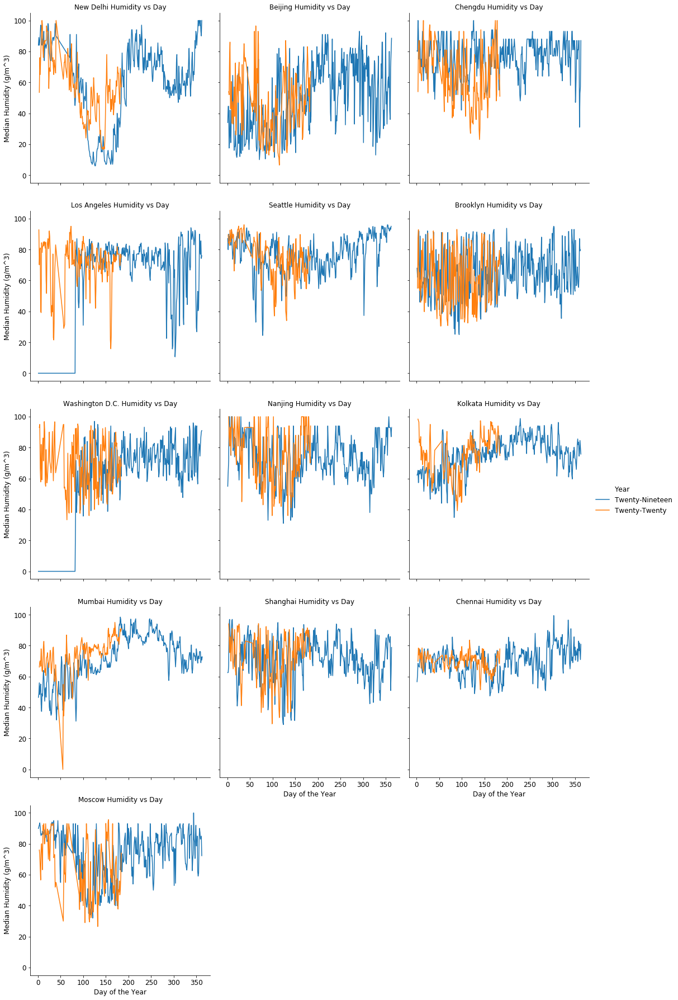

In [32]:
sns.relplot(x='Day Of Year', y='median', hue='Year', col='City', col_wrap=3, kind='line', data=humidity).set_titles("{col_name} Humidity vs Day").set_axis_labels("Day of the Year","Median Humidity (g/m^3)")

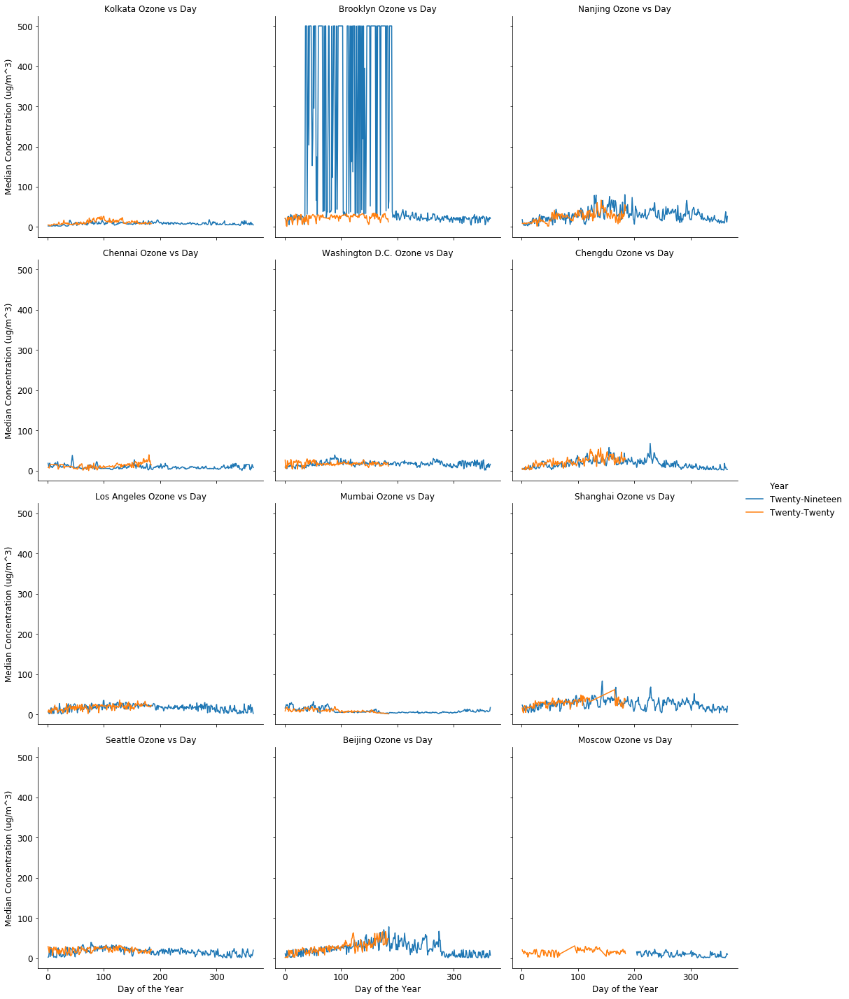

In [33]:
sns.relplot(x='Day Of Year', y='median', hue='Year', col='City', col_wrap=3, kind='line', data=o3).set_titles("{col_name} Ozone vs Day").set_axis_labels("Day of the Year","Median Concentration (ug/m^3)")

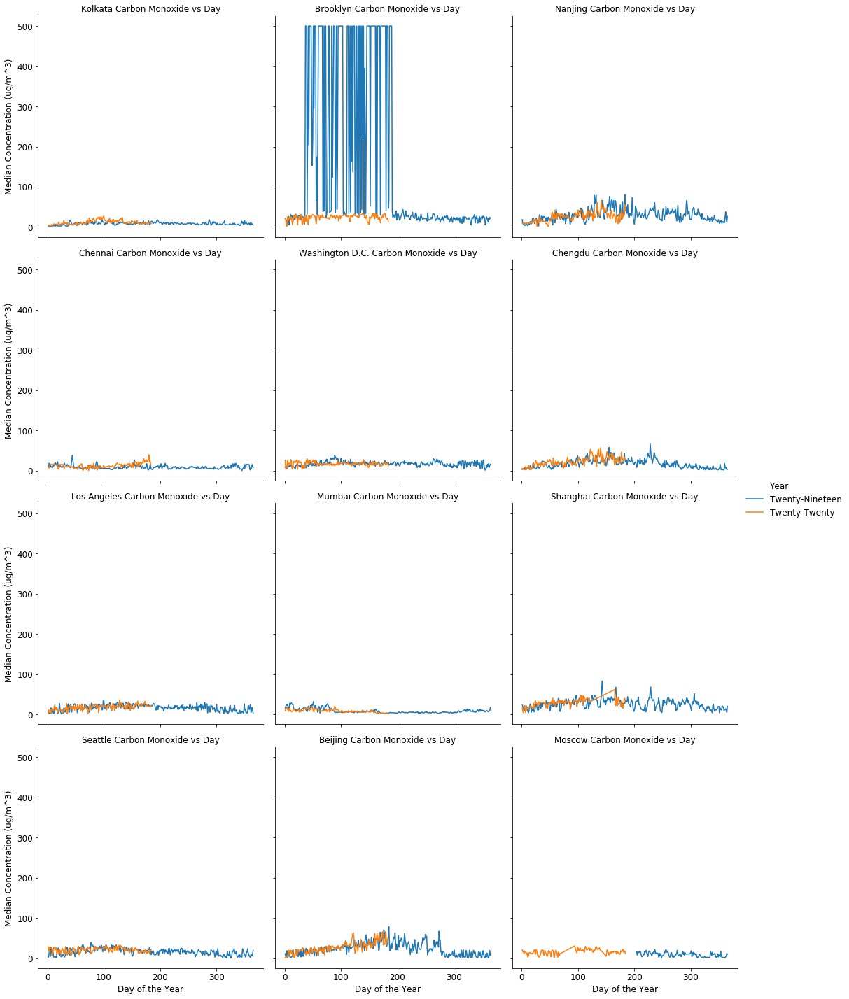

In [34]:
sns.relplot(x='Day Of Year', y='median', hue='Year', col='City', col_wrap=3, kind='line', data=o3).set_titles("{col_name} Carbon Monoxide vs Day").set_axis_labels("Day of the Year","Median Concentration (ug/m^3)")

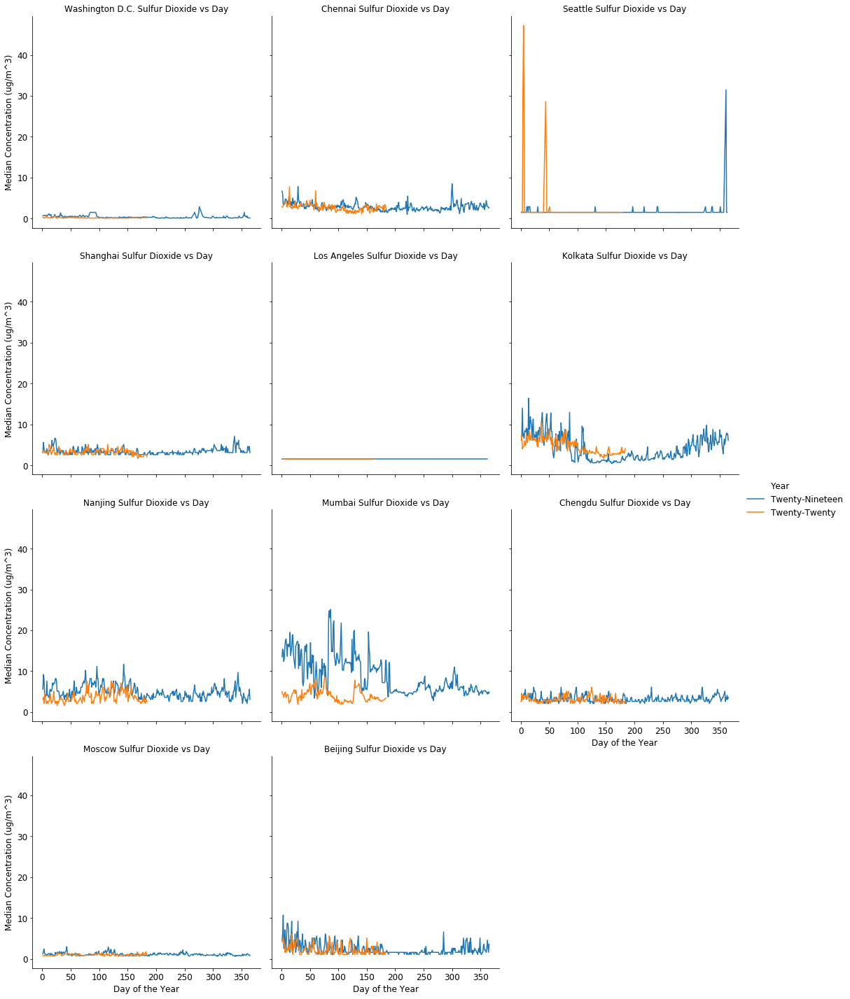

In [35]:
sns.relplot(x='Day Of Year', y='median', hue='Year', col='City', col_wrap=3, kind='line', data=so2).set_titles("{col_name} Sulfur Dioxide vs Day").set_axis_labels("Day of the Year","Median Concentration (ug/m^3)")

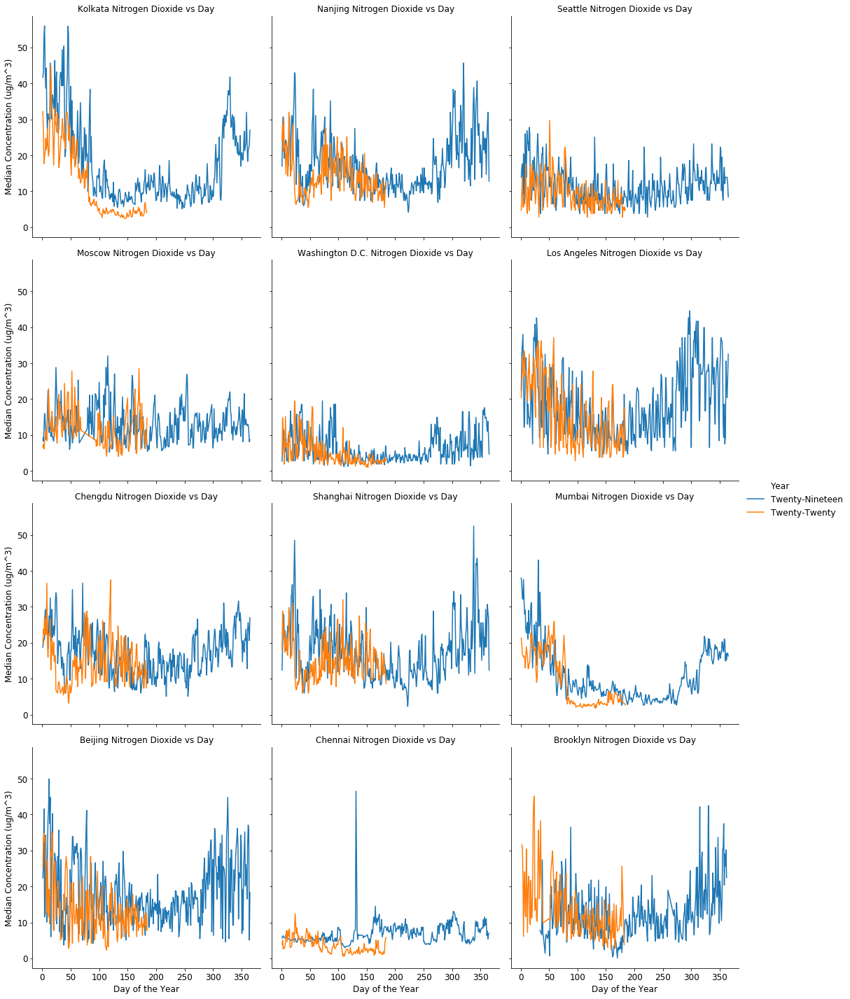

In [36]:
sns.relplot(x='Day Of Year', y='median', hue='Year', col='City', col_wrap=3, kind='line', data=no2).set_titles("{col_name} Nitrogen Dioxide vs Day").set_axis_labels("Day of the Year","Median Concentration (ug/m^3)")

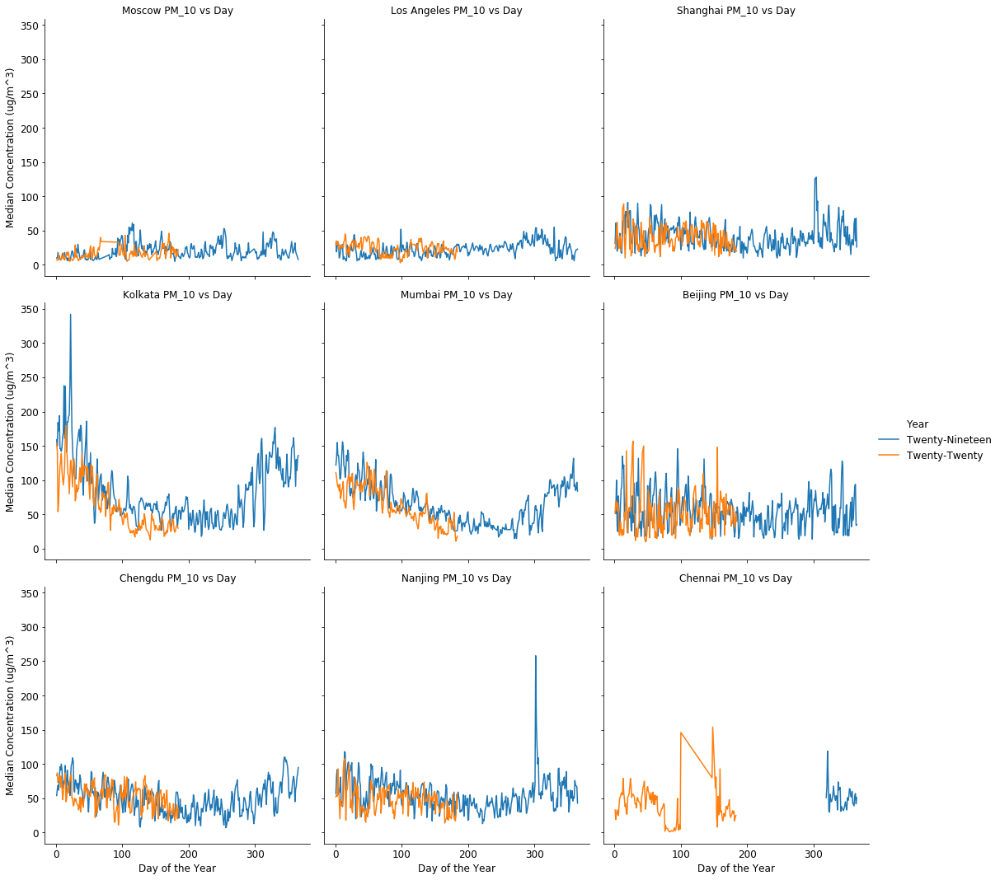

In [37]:
sns.relplot(x='Day Of Year', y='median', hue='Year', col='City', col_wrap=3, kind='line', data=pm10).set_titles("{col_name} PM_10 vs Day").set_axis_labels("Day of the Year","Median Concentration (ug/m^3)")

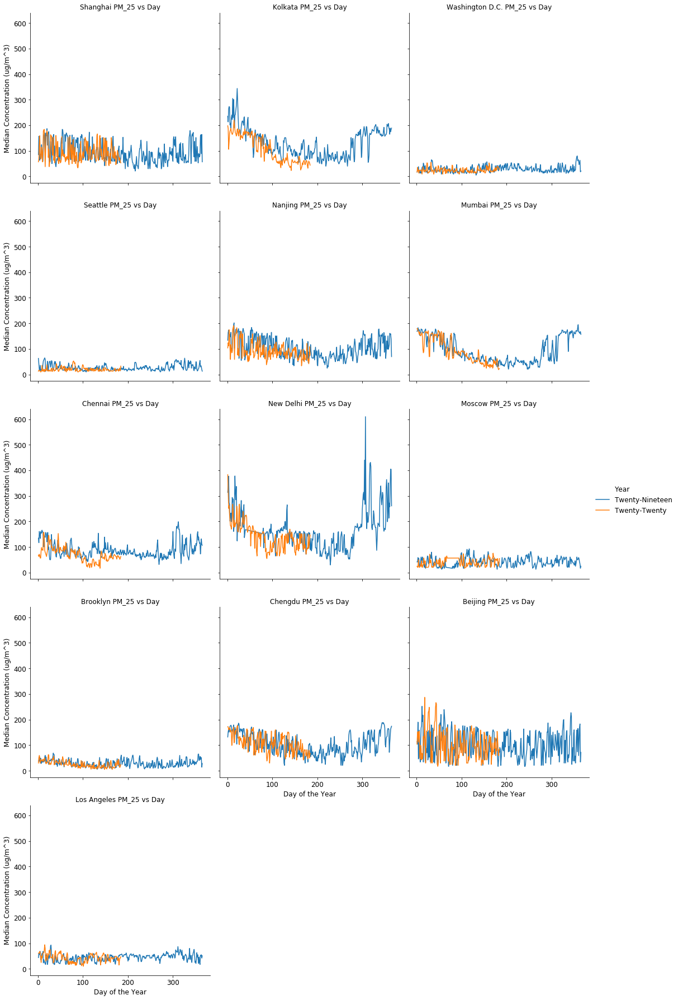

In [38]:
sns.relplot(x='Day Of Year', y='median', hue='Year', col='City', col_wrap=3, kind='line', data=pm25).set_titles("{col_name} PM_25 vs Day").set_axis_labels("Day of the Year","Median Concentration (ug/m^3)")

In looking at the above graphs, we can see some interesting trends. In particular, the measurements of atmospheric particulates ($PM_{10}$ and $PM_{2.5}$) seem to have had stark decreases with the onset of lockdowns in industrial countries like India.

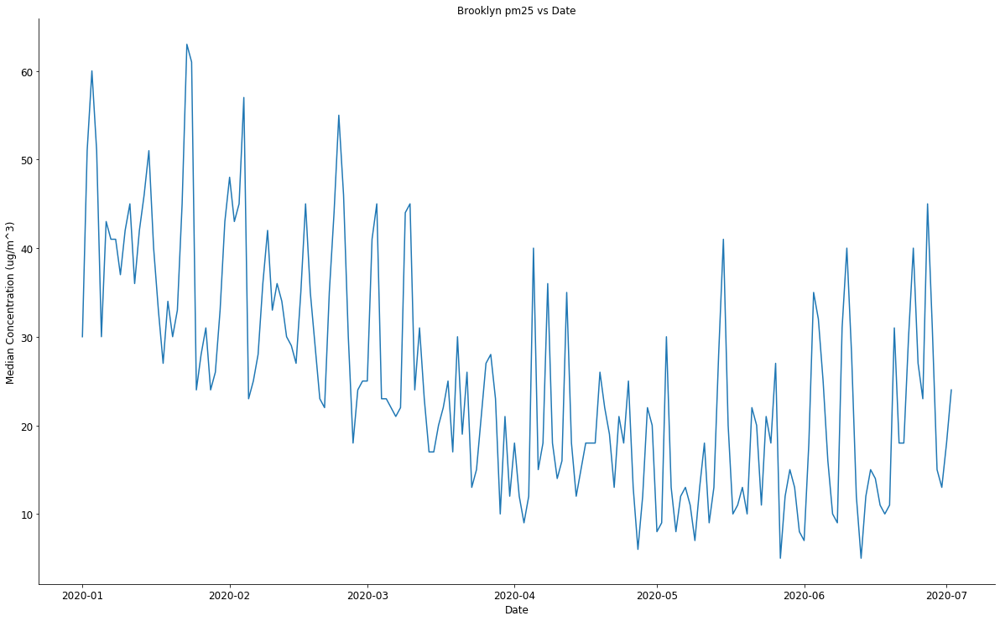

In [39]:
brooklynpm25 = pm25.loc[pm25['Year'] == 'Twenty-Twenty']
brooklynpm25 = brooklynpm25.loc[brooklynpm25['City'] == 'Brooklyn']
g = sns.relplot(x='Date', y='median', col='City', kind='line', data=brooklynpm25).set_titles("{col_name} pm25 vs Date").set_axis_labels("Date","Median Concentration (ug/m^3)")
g.fig.set_figwidth(20)
g.fig.set_figheight(12)

Looking at the above graph of Brooklyn's $PM_{2.5}$ values vs date, it's apparent that there was a decrease during the beginning of the lockdown.

# 5.0 Analysis, Hypothesis Testing & ML

### 5.1 Indian Pollution Reduction Due To Lockdown

Below we'll plot the overall Indian $PM_{2.5}$ for 2019 and 2020, with confidence intervals.

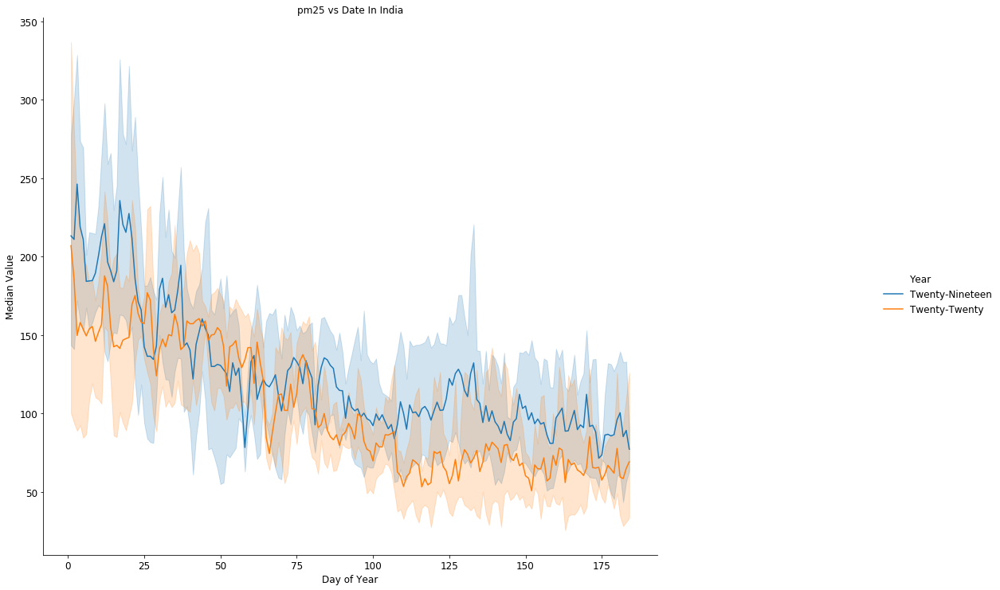

In [40]:
india_aqi_2020 = aqi2020.loc[aqi2020['Country'] == 'IN']
india_pm25_2020 = india_aqi_2020.loc[india_aqi_2020['Specie'] == 'pm25']
india_aqi_2019 = aqi2019.loc[aqi2019['Country'] == 'IN']
india_aqi_2019 = india_aqi_2019.drop(india_aqi_2019[india_aqi_2019['Day Of Year'] >= 185].index)
india_pm25_2019 = india_aqi_2019.loc[india_aqi_2019['Specie'] == 'pm25']
pm25list = [india_pm25_2019,india_pm25_2020]
india_pm25 = pd.concat(pm25list)
g = sns.relplot(x='Day Of Year', y='median', hue='Year', col='Specie', kind='line', data=india_pm25).set_titles("{col_name} vs Date In India").set_axis_labels("Day of Year","Median Value")
g.fig.set_figwidth(20)
g.fig.set_figheight(12)

Lockdown in India started on 25 March 2020, which was the 85th day of the year. Indeed, we can see that on the above graph, Indian fine particulate pollution started to diverge significantly from 2019's levels starting around the 80th day of the year in 2020. This possibly indicates that the 2020 lockdown had a long-term effect on the smog and other fine-particulate pollution in India.

### 5.2 New York City Distancing And AQI

First, we would like to test a correlation between activity in New York and Air Quality. Below we'll plot a graph of each Specie's measurement vs Number of Trips on the same date.

In [41]:
ny_lockdown_aqi = pd.DataFrame.merge(ny_trips, aqi2020.loc[aqi2020['City'] == 'Brooklyn']) # match trips and specie by same date
keepbrooklyncolumns = ['Date','Population Staying at Home','Population Not Staying at Home','Number of Trips','Specie','median','variance']
ny_lockdown_aqi = ny_lockdown_aqi[keepbrooklyncolumns]

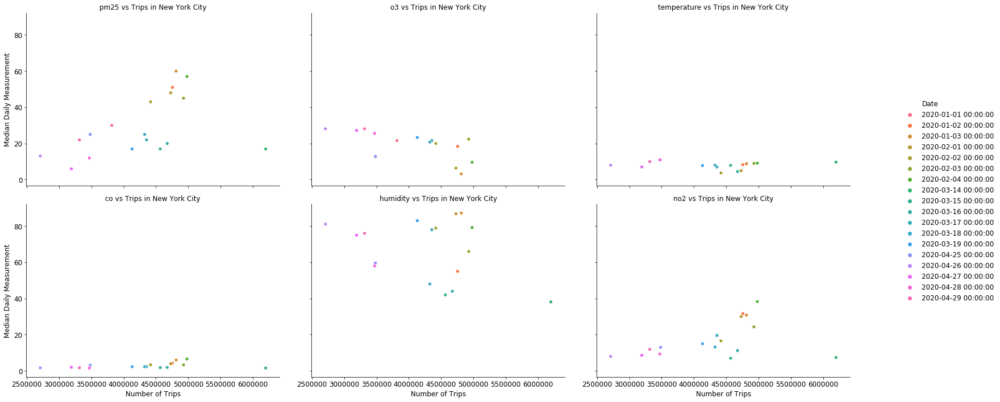

In [42]:
g = sns.relplot(x='Number of Trips', y='median', hue='Date', col='Specie', col_wrap=3, data=ny_lockdown_aqi).set_titles("{col_name} vs Trips in New York City").set_axis_labels("Number of Trips","Median Daily Measurement")
g.fig.set_figwidth(25)
g.fig.set_figheight(10)

The AQI Specie with the possibility of a correlation are $PM_{2.5}$, $NO_2$, and $O_3$ levels. We'll plot them below with linear fit lines.

Text(0.5, 1.0, 'PM_25 vs Number of Trips in NYC')

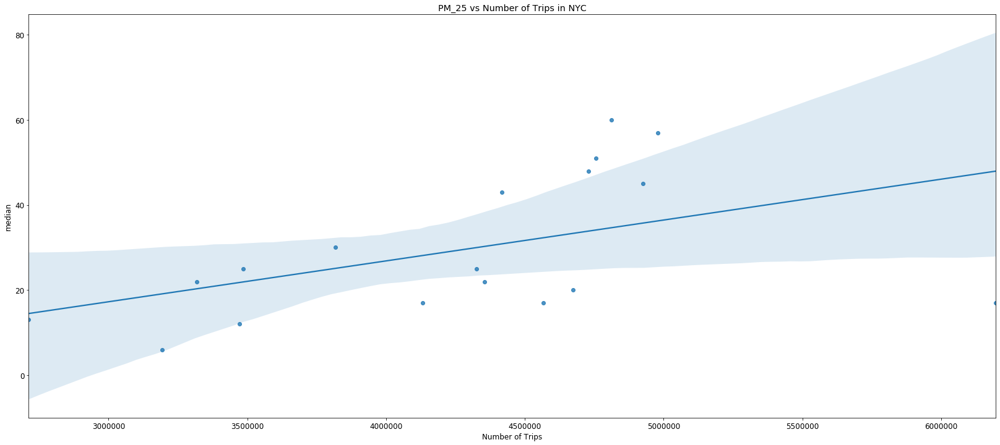

In [43]:
ny_lockdown_pm25 = ny_lockdown_aqi.loc[ny_lockdown_aqi['Specie'] == 'pm25']
sns.regplot(ny_lockdown_pm25['Number of Trips'],ny_lockdown_pm25['median'])
plt.title("PM_25 vs Number of Trips in NYC")

Text(0.5, 1.0, 'Nitrogen Dioxide vs Number of Trips in NYC')

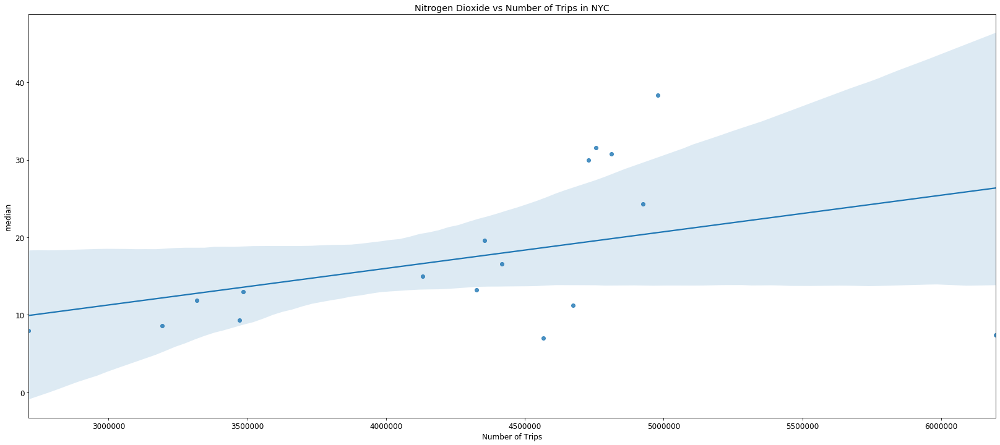

In [44]:
ny_lockdown_no2 = ny_lockdown_aqi.loc[ny_lockdown_aqi['Specie'] == 'no2']
sns.regplot(ny_lockdown_no2['Number of Trips'],ny_lockdown_no2['median'])
plt.title("Nitrogen Dioxide vs Number of Trips in NYC")

Text(0.5, 1.0, 'Ozone vs Number of Trips in NYC')

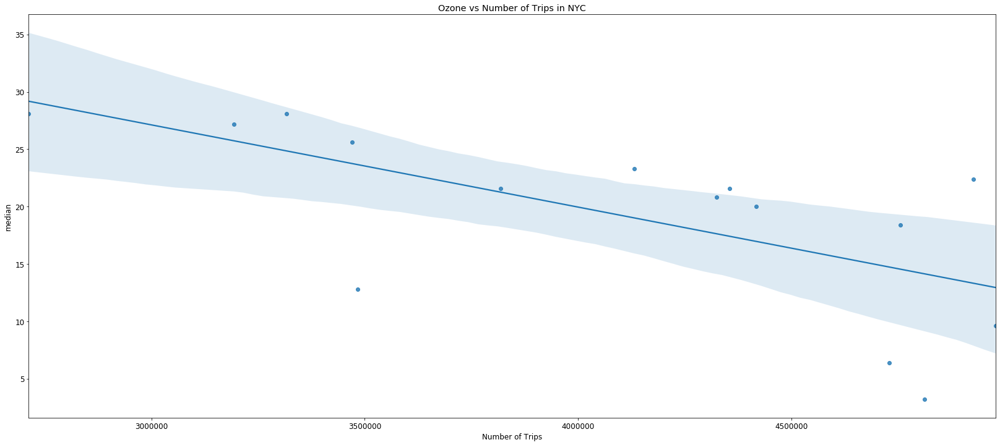

In [45]:
ny_lockdown_o3 = ny_lockdown_aqi.loc[ny_lockdown_aqi['Specie'] == 'o3']
sns.regplot(ny_lockdown_o3['Number of Trips'],ny_lockdown_o3['median'])
plt.title("Ozone vs Number of Trips in NYC")

All of these seem promising. However, given the confidence intervals, it is somewhat likely that these data don't follow linear trends.

We will now try and find a model to determine the effects of trip number in New York City on the pollution levels. In particular, we'll focus on fine particulate ($PM_{2.5}$) levels. We'll try and do a cubic polynomial fit.

Text(0.5, 1.0, 'Fit of NYC PM_2.5 vs Number of Trips')

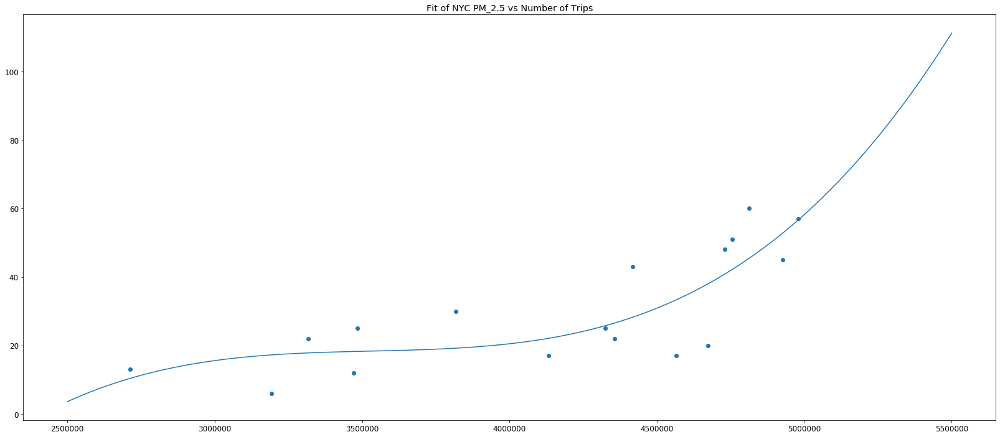

In [46]:
# We will drop one extraneous value
ny_lockdown_pm25 = ny_lockdown_pm25.drop(ny_lockdown_pm25[ny_lockdown_pm25['Number of Trips'] >= 5500000].index)

X = ny_lockdown_pm25[['Number of Trips']]
X = X - 2500000
y = ny_lockdown_pm25['median']

poly = PolynomialFeatures(degree=3)
poly_X = poly.fit_transform(X)

poly_model = LinearRegression()
poly_model.fit(poly_X,y)

coefs = poly_model.coef_
tripnum = np.linspace(0, 3000000, 3000001).reshape(-1, 1)
poly_trips = poly.fit_transform(tripnum)
tripnum = tripnum + 2500000
predictions = poly_model.predict(poly_trips)

plt.plot(tripnum, predictions)
plt.scatter(x=ny_lockdown_pm25['Number of Trips'], y=ny_lockdown_pm25['median'])
plt.title('Fit of NYC PM_2.5 vs Number of Trips')

From the above graph we can see that there is a fairly decent fit of the predicted line to the original data.

Now let's do a Pearson Chi-Squared test on the data to see its correlation.

In [47]:
stat, pval = pearsonr(ny_lockdown_pm25['Number of Trips'],ny_lockdown_pm25['median'])
print("Correlation Coefficient: " + str(stat))
print("The p-value is: " + str(pval))

Correlation Coefficient: 0.7288690254249743
The p-value is: 0.0009029726797810695


This p-value is less than 0.05, meaning that the correlation between the Number of Trips and the $PM_{2.5}$ in New York City *is* statistically significant.

# 6.0 Insight & Policy Decision

From our analyses above, we have seen a tentative correlation between people going outside and the amount of air pollution in urban areas. With our study of New York City, we saw that as the number of trips increased, so too did air pollutants (in particular we looked at the correlation in $PM_{2.5}$). This indicates that at least in part there is an association between staying at home and a reduction in air pollution.

However, this research is not yet over. We only studied one city in this regard. In the future, it would be very useful to do similar analyses of this kind for a number of other cities across the globe. Doing so would require obtaining trip data for those cities, which we were unable to do in this project. Additionally, we haven't found any causative links, only correlative ones. Thus, future studies should focus on trying to acertain the exact causative pathways that cause this correlation of reduced air pollution to occur when people stop going out.